In [1]:
import matplotlib.pyplot as plt
import matplotlib
import numpy as np

from skimage import data, color

%matplotlib inline

# Filters, Contrast, Transformation and Morphology

In [2]:
# Loading preset data
coffee_image = data.coffee()
coins_image = data.coins()

Coffee image shape: (400, 600, 3)
Coffee image size: 720000


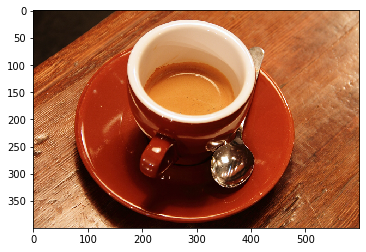

In [3]:
# Verify the shape and plot the images

# RGB image
plt.imshow(coffee_image)
print(f"Coffee image shape:",coffee_image.shape)
print(f"Coffee image size:",coffee_image.size)
plt.show()

Coins image shape: (303, 384)
Coins image size: 116352


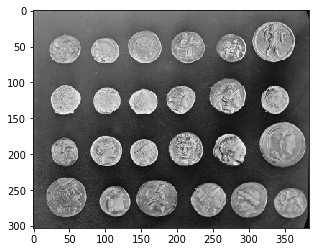

In [4]:
# Grayscale image
plt.imshow(coins_image, cmap="gray")
print(f"Coins image shape:",coins_image.shape)
print(f"Coins image size:",coins_image.size)
plt.show()

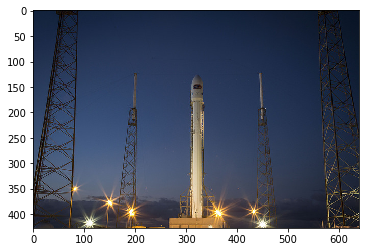

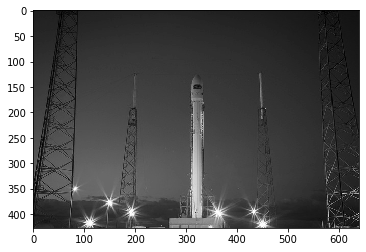

In [5]:
# RGB to gray

rocket = data.rocket()
plt.imshow(rocket)
plt.show()

# Convert the image to grayscale
gray_scaled_rocket = color.rgb2gray(rocket)
plt.imshow(gray_scaled_rocket, cmap="gray")
plt.show()

In [41]:
def plot_comparison(original, filtered, title_filtered):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 12), sharex=True,sharey=True)
    ax1.imshow(original, cmap=plt.cm.gray)
    ax1.set_title('original')
    ax1.axis('off')
    ax2.imshow(filtered, cmap=plt.cm.gray)
    ax2.set_title(title_filtered)
    ax2.axis('off')

## Edge detection

### Sobel

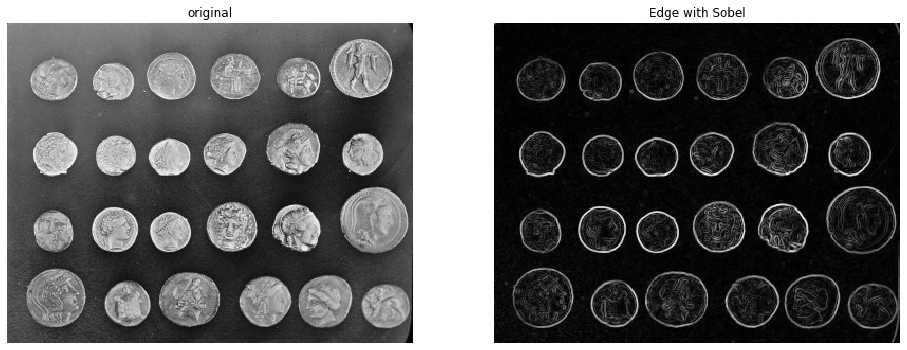

In [42]:
# Import module and function
from skimage.filters import sobel
# Apply edge detection filter
edge_sobel = sobel(coins_image)
# Show original and resulting image to compare

plot_comparison(coins_image, edge_sobel,"Edge with Sobel")

# plt.imshow(coins_image, cmap="gray")
# plt.show()

# plt.imshow(edge_sobel, cmap="gray")
# plt.show()

### Gaussian Smoothing

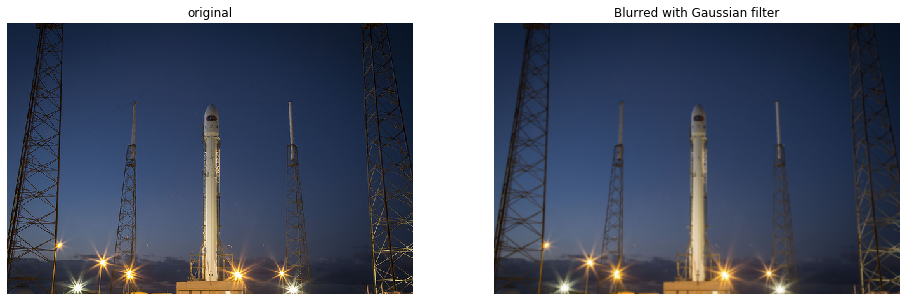

In [43]:
# Import the module and function
from skimage.filters import gaussian
# Apply edge detection filter
gaussian_image = gaussian(rocket, multichannel=True)

# Show original and resulting image to compare
plot_comparison(rocket, gaussian_image,"Blurred with Gaussian filter")

## Contrast enhancement

Contrast improvement can improve some characteristics/details of the image

* Contrast stretching
* Histogram equalization
    * Standard
    * Adaptive
    * Contrast limited

### Standard Histogram Equalization

Original


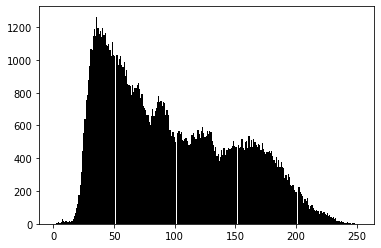

Equalized


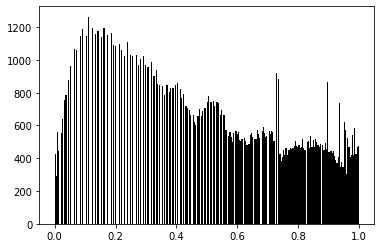

In [44]:
from skimage import exposure
# Obtain the equalized image
image_eq = exposure.equalize_hist(coins_image)

# Plot the histograms
print("Original")
plt.hist(coins_image.ravel(), bins=256, color="black");
plt.show()

print("Equalized")
plt.hist(image_eq.ravel(), bins=256, color="black");
plt.show()

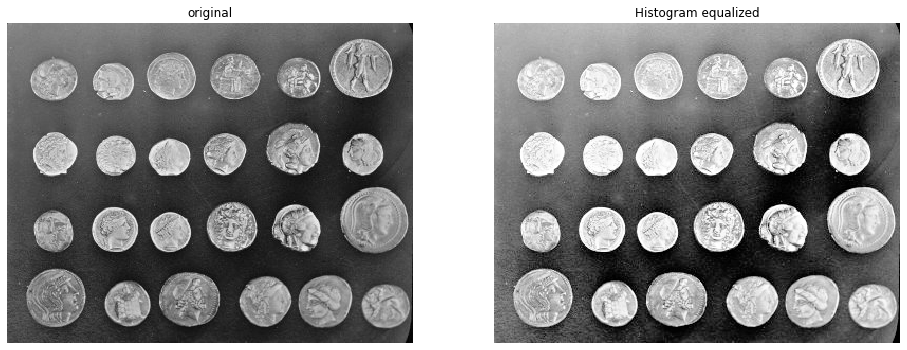

In [45]:
# Show original and result
plot_comparison(coins_image, image_eq,'Histogram equalized')

### Adaptative histogram equalization (AHE)



https://en.wikipedia.org/wiki/Adaptive_histogram_equalization#CLAHE

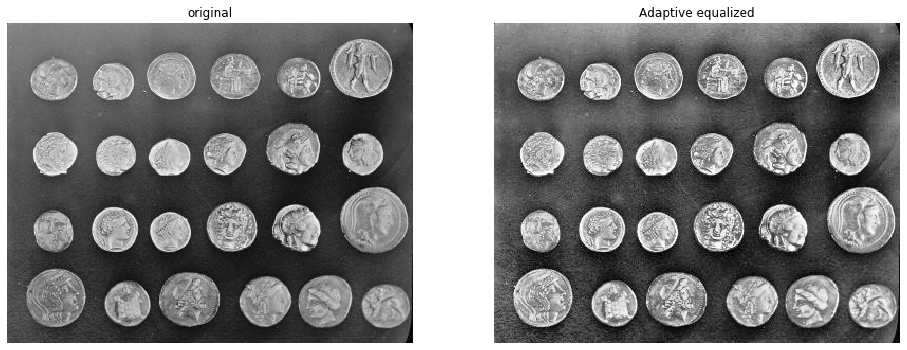

In [58]:
from skimage import exposure
# Apply adaptive Equalization
image_adapteq = exposure.equalize_adapthist(coins_image)
# Show original and result
plot_comparison(coins_image, image_adapteq, 'Adaptive equalized')


Original


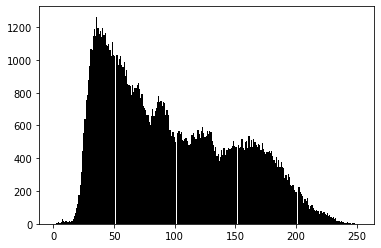

Equalized


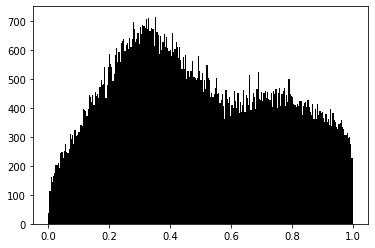

In [60]:
print("Original")
plt.hist(coins_image.ravel(), bins=256, color="black");
plt.show()

print("Equalized")
plt.hist(image_adapteq.ravel(), bins=256, color="black");
plt.show()

### Contrast limited adaptive histogram equalization (CLAHE)

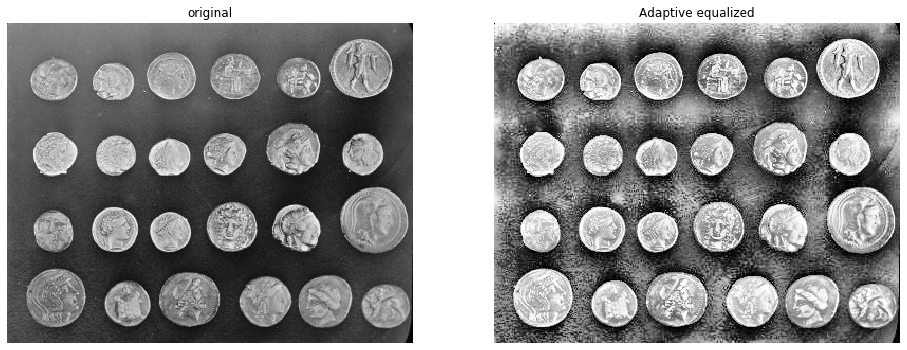

In [73]:
from skimage import exposure
image = coins_image
# Apply adaptive Equalization
image_clahe = exposure.equalize_adapthist(image, clip_limit=0.3)
# Show original and result
plot_comparison(image, image_clahe, 'Adaptive equalized')

Original


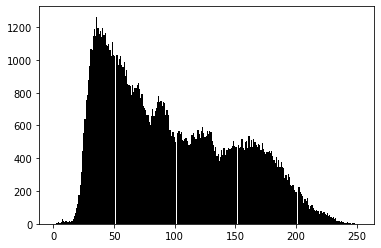

Equalized


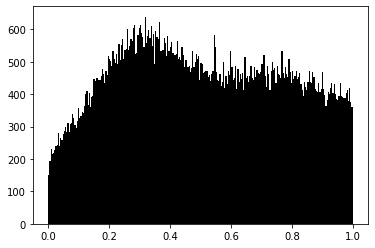

In [74]:
print("Original")
plt.hist(image.ravel(), bins=256, color="black");
plt.show()

print("Equalized")
plt.hist(image_clahe.ravel(), bins=256, color="black");
plt.show()

## Contrast of an image

In [77]:
image = coins_image
print(f"The contrast of the image is: ", np.max(image)-np.min(image))

image = image_clahe
print(f"The contrast of the image is: ", np.max(image)-np.min(image))

The contrast of the image is:  251
The contrast of the image is:  1.0


## Transformations

* Rotation
* Rescaling
* Aliasing
* Resizing

### Rotation

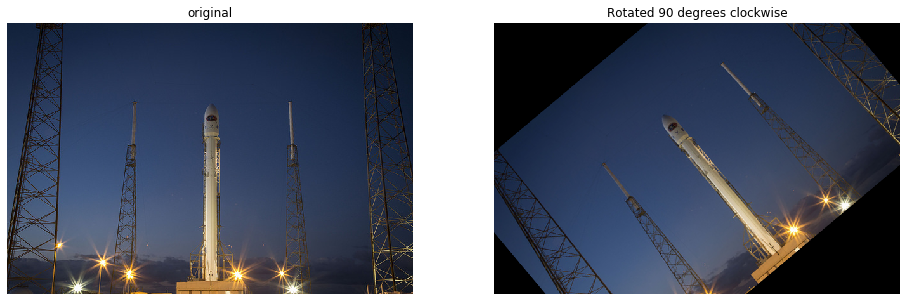

In [84]:
from skimage.transform import rotate
image = data.rocket()
# Rotate the image 90 degrees clockwise
image_rotated = rotate(image,40)
plot_comparison(image, image_rotated, 'Rotated 90 degrees clockwise')

### Rescaling

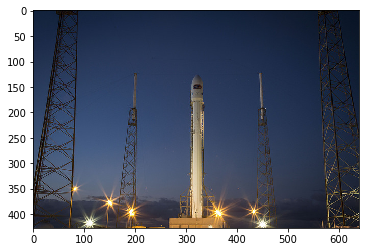

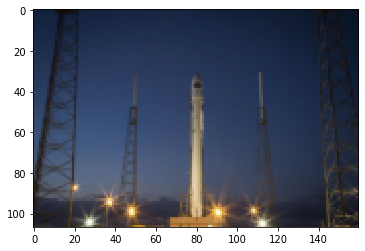

In [92]:
from skimage.transform import rescale
# Rescale the image to be 4 times smaller
image_rescaled = rescale(image, 1/4, anti_aliasing=True, multichannel=True)

plt.imshow(image)
plt.show()

plt.imshow(image_rescaled)
plt.show()

### Resizing

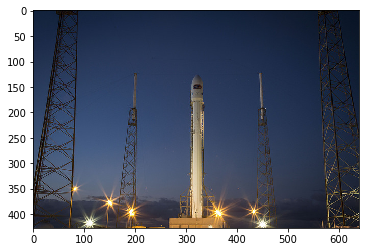

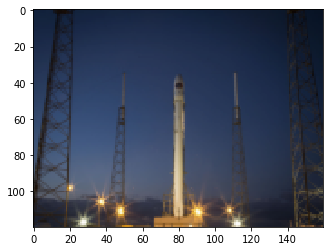

In [95]:
from skimage.transform import resize
# Height and width to resize
height = 120
width = 160
# Resize image
image_resized = resize(image, (height, width), anti_aliasing=True)
# Show the original and resulting images
plt.imshow(image)
plt.show()

plt.imshow(image_resized)
plt.show()

#### Rescaling Proportionally

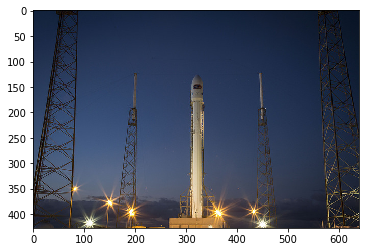

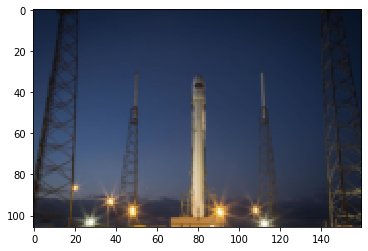

In [97]:
from skimage.transform import resize
# Set proportional height so its 4 times its size
height = int(image.shape[0] / 4)
width = int(image.shape[1] / 4)
# Resize image
image_resized = resize(image, (height, width), anti_aliasing=True)

plt.imshow(image)
plt.show()

plt.imshow(image_resized)
plt.show()

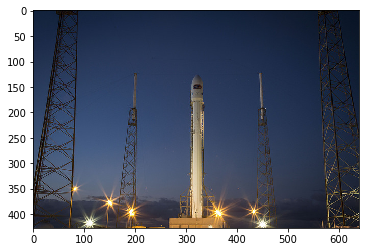

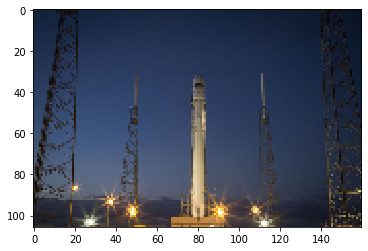

In [98]:
from skimage.transform import resize
# Set proportional height so its 4 times its size
height = int(image.shape[0] / 4)
width = int(image.shape[1] / 4)
# Resize image
image_resized = resize(image, (height, width), anti_aliasing=False)

plt.imshow(image)
plt.show()

plt.imshow(image_resized)
plt.show()

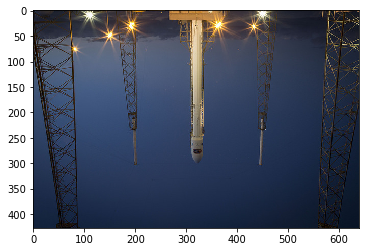

In [14]:
# Flip images vertically 
rocket_vertical_flip = np.flipud(rocket)
plt.imshow(rocket_vertical_flip, cmap="gray")
plt.show()

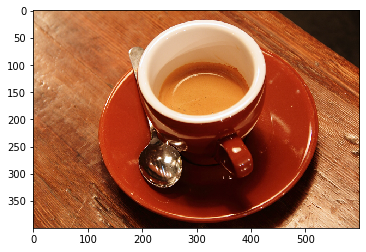

In [16]:
# Flip images horizontally 
coffee_horizontal_flip = np.fliplr(coffee_image)
plt.imshow(coffee_horizontal_flip, cmap="gray")
plt.show()

## Histograms

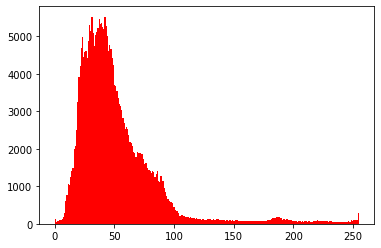

In [18]:
# Obtain the red channel
red_channel = rocket[:, :, 0]

# Plot the red histogram with bins in a range of 256
plt.hist(red_channel.ravel(), bins=256, color="red");
# OR
# plt.hist(red_channel.reshape(1, -1)[0], bins=256, color="red")

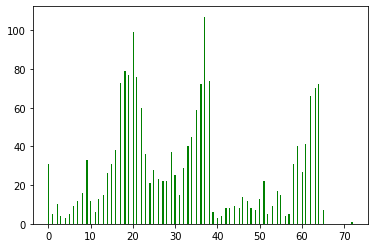

In [20]:
# Obtain the green channel
green_channel = rocket[0, :, :]

# Plot the red histogram with bins in a range of 256
plt.hist(green_channel.ravel(), bins = 256, color = "green");

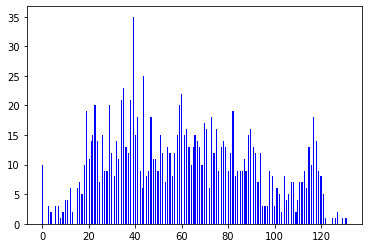

In [21]:
# Obtain the green channel
blue_channel = rocket[:, 0, :]

# Plot the red histogram with bins in a range of 256
plt.hist(blue_channel.ravel(), bins = 256, color = "blue");


## Tresholding

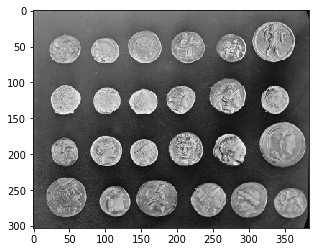

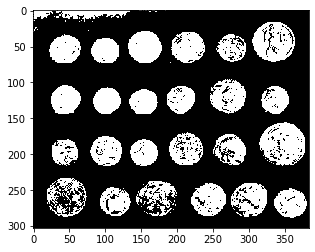

In [32]:
# Image in grayscale
image = coins_image

# Obtain the optimal threshold value
thresh = 127
# Apply thresholding to the image
binary = coins_image > thresh
# Show the original and thresholded
plt.imshow(coins_image, cmap="gray")
plt.show()

plt.imshow(binary, cmap="gray")
plt.show()

## Inverted tresholding

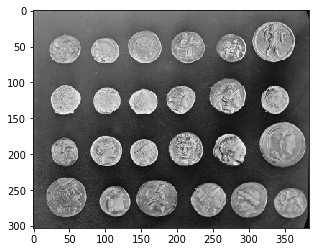

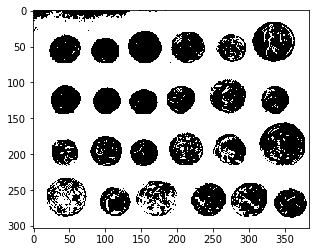

In [33]:
# Image in grayscale
image = coins_image

# Obtain the optimal threshold value
thresh = 127

# Apply thresholding to the image
binary = coins_image <= thresh

# Show the original and inverted thresholded
plt.imshow(coins_image, cmap="gray")
plt.show()

plt.imshow(binary, cmap="gray")
plt.show()

## Multiple tresholding

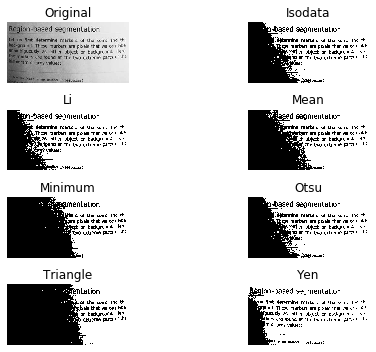

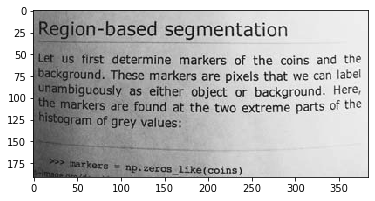

In [48]:
from skimage.filters import try_all_threshold

img = data.page()

# Obtain all the resulting images
fig, ax = try_all_threshold(img, verbose=False)

# Showing resulting plots
plt.show()

plt.imshow(img, cmap="gray")

## Global optimal tresh value

Tries to remove the bakckground of the image without affecting the items on it.

Works like the Fisher discriminant method.

The algorithm exhaustively searches for the threshold that minimizes the intra-class variance, defined as a weighted sum of variances of the two classes


<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/3/34/Otsu%27s_Method_Visualization.gif/440px-Otsu%27s_Method_Visualization.gif">

https://en.wikipedia.org/wiki/Otsu%27s_method

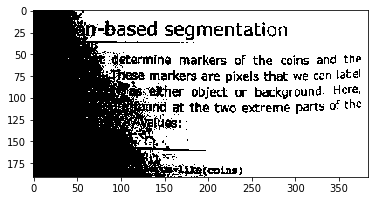

In [81]:
# Import the otsu threshold function
from skimage.filters import threshold_otsu

img = data.page()

# Obtain the optimal threshold value
thresh = threshold_otsu(img)

# Apply thresholding to the image
binary_global = img > thresh

plt.imshow(binary_global, cmap="gray")
plt.show()

# Local optimal tresh value

It works as an adaptative threshold, calcularing the threshold locally for each pixel in a neighborhood of **block_size** size.

https://docs.opencv.org/2.4/modules/imgproc/doc/miscellaneous_transformations.html?highlight=threshold#adaptivethreshold

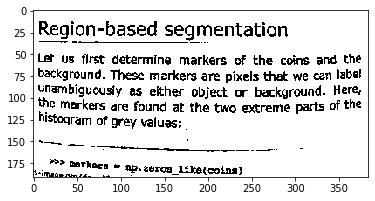

In [79]:
# Import the local threshold function
from skimage.filters import threshold_local
text_image = data.page()

# Set the block size to 55 - this number is set each 5. Ex 5, 15, 25, 105, 55, 2005 ... 
block_size = 55
# Obtain the optimal local thresholding
local_thresh = threshold_local(text_image, block_size, offset=12)
# Apply local thresholding and obtain the binary image
binary_local = text_image > local_thresh

plt.imshow(binary_local, cmap="gray")
plt.show()